In [1]:
import os
import re
import copy
import json
import numpy as np
import codecs
import pylcs
import pandas as pd
import scipy.io as sio
import matplotlib.pyplot as plt

In /home/jd/anaconda3/envs/music/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/jd/anaconda3/envs/music/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/jd/anaconda3/envs/music/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/jd/anaconda3/envs/music/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/jd/anaconda3/envs/music

In [2]:
%load_ext autoreload
%autoreload 2

# Utilities

In [3]:
def loadcache(name, path="."):
    out = np.load(f"{os.path.join(path, name)}.npy", allow_pickle=True)
    if isinstance(out, np.ndarray):
        return out
    else:
        return out.item()

In [4]:
def savecache(data, name, path="."):
    np.save(f"{os.path.join(path, name)}.npy", data)
    return 0

# Get Alignment

Load the alignment file

In [5]:
alignment = loadcache("alignment")

# ------------------------------- MOVIE ---------------------------

# Get Scenes

In [ ]:
SCENE_BREAK_PATH = "processed/hp/scene_detect_output.mat"

In [7]:
scene_breaks = sio.loadmat(SCENE_BREAK_PATH)['scene_breaks']
scene_breaks = scene_breaks - 1 # Convert from matlab indexing to python
scene_breaks = np.array(list(filter(lambda x: x[2], scene_breaks))) # Remove empty scenes
# scene_breaks

array([[   0,    8,    8],
       [   9,   25,   16],
       [  26,   46,   20],
       [  47,   59,   12],
       [  60,   83,   23],
       [  84,  120,   36],
       [ 121,  155,   34],
       [ 156,  169,   13],
       [ 170,  189,   19],
       [ 190,  195,    5],
       [ 196,  214,   18],
       [ 215,  234,   19],
       [ 235,  248,   13],
       [ 249,  281,   32],
       [ 282,  299,   17],
       [ 300,  339,   39],
       [ 340,  354,   14],
       [ 355,  361,    6],
       [ 362,  379,   17],
       [ 380,  386,    6],
       [ 387,  403,   16],
       [ 404,  428,   24],
       [ 429,  451,   22],
       [ 452,  481,   29],
       [ 482,  499,   17],
       [ 500,  523,   23],
       [ 524,  533,    9],
       [ 534,  572,   38],
       [ 573,  592,   19],
       [ 593,  650,   57],
       [ 651,  656,    5],
       [ 657,  663,    6],
       [ 664,  684,   20],
       [ 685,  704,   19],
       [ 705,  737,   32],
       [ 738,  775,   37],
       [ 776,  799,   23],
 

In [8]:
def shotsPerScene(scene):
    return np.arange(scene_breaks[scene][0], scene_breaks[scene][1]+1)

# Load Scene Break Times

In [9]:
scene_break_times = loadcache("scene_break_times")

# Get all Subtitles within range

In [10]:
from pysrt.srttime import SubRipTime

In [11]:
f = open("./data/HP/transcript.json", "r")
f = json.load(f)
TRANSCRIPT = f['transcript']

In [12]:
def get_subtitles(start, end):
    matched_subs = []
    for subtitle in TRANSCRIPT:
        
        if subtitle['type']:
            continue

        time = subtitle['time']
        time_s = SubRipTime.from_string(subtitle['time'].split("-->")[0])
        time_ms = time_s.ordinal // 1000
        
#         time_ms = time_s.hour * 60 * 60 + time_s.minute * 60 + time_s.second

        if time_ms >= start and time_ms <= end:
            matched_subs.append(subtitle)
    return matched_subs

# ------------------------------- Book ----------------------------------

In [13]:
import nltk
import Stemmer
import math

In [14]:
from collections import Counter

In [15]:
from utils import *
from nltk.tokenize import word_tokenize, sent_tokenize
from lcs import *

In [16]:
from scripts.bookQuoteExtractor import Book, BookChunked, chapterText

In [17]:
chapters = sorted(os.listdir("processed/hp/text_segments"), key=lambda x: int(x.split('-')[0]))

In [18]:
book = BookChunked(chapters, "processed/hp/text_segments")

In [19]:
words = word_tokenize(book.getAllText().lower())

stemmer = Stemmer.Stemmer('english')
stemmer.maxCacheSize = 10000

words = stemmer.stemWords(words)
wordCount = Counter(words)

In [20]:
idf = {word: 1/wordCount[word] for word in wordCount.keys()}

# Load CLIP and convert alignment to chunk-scene format

In [ ]:
from sentence_transformers import SentenceTransformer, util
from PIL import Image

In [ ]:
#Load CLIP model
model = SentenceTransformer('clip-ViT-B-32')

Compute image features for every shot in the movie

In [24]:
SHOT_DIR = "VideoSceneDetection/data/bbt_s01e01_excerpt"
shot_imgs = sorted(os.listdir(SHOT_DIR))

In [ ]:
feats = []
for i in range(len(shot_imgs)):
    img = Image.open(os.path.join(SHOT_DIR, shot_imgs[i]))
    feat = model.encode(img)
    feats.append([feat])
feats = np.array(feats)
np.savetxt("processed/hp/img_features/feats.csv", feats, delimiter=",")

In [23]:
# # Load pre-computed shot features
# shot_features = np.asarray(pd.read_csv(os.path.join("../Text-Scene-Segmentation/img_features", "hp.csv"), header=None), dtype=np.float32)

Match chunk and scene using Text only

In [25]:
def text_process_dialogue(sent):
    sent = lower_text(sent)
    sent = remove_extra_whitespace(sent)
    sent = remove_punctuation(sent)
    sent = word_tokenize(sent)
    
    return sent

In [26]:
CONCRETE_WORDS = pd.read_csv("data/concrete_words.txt", sep="\t")
print(CONCRETE_WORDS.head())

CONCRETE_WORDS = CONCRETE_WORDS.set_index('Word').T.to_dict('list')

            Word  Bigram  Conc.M  Conc.SD  Unknown  Total  Percent_known  \
0    roadsweeper       0    4.85     0.37        1     27           0.96   
1    traindriver       0    4.54     0.71        3     29           0.90   
2           tush       0    4.45     1.01        3     25           0.88   
3      hairdress       0    3.93     1.28        0     29           1.00   
4  pharmaceutics       0    3.77     1.41        4     26           0.85   

   SUBTLEX Dom_Pos  
0        0       0  
1        0       0  
2       66       0  
3        1       0  
4        0       0  


[0, 4.85, 0.37, 1, 27, 0.96, 0, '0']

In [27]:
def concrete_filter(para):
    sentences = sent_tokenize(para)
    sentence_scores = []
    
    for sentence in sentences:
        word_scores = []

        sentence_words_pos = nltk.pos_tag(sentence.split())
        sentence_words_tup = list(filter(lambda x: x[1] in ['NN', 'NNS'], sentence_words_pos))
        
        for (word, tag) in sentence_words_tup:
            if word in CONCRETE_WORDS.keys():
                word_scores.append(CONCRETE_WORDS[word][1])
            
#         sentence_words_tup = list(filter(lambda x: x[1] in ['NNP', 'NNPS'], sentence_words_pos))            
#         for (word, tag) in sentence_words_tup:
#             word_scores.append(5)

        if len(word_scores) == 0:
            word_scores = [0]

        sentence_scores.append(np.mean(word_scores))
        
    sorted_sentences = [i[1] for i in sorted(enumerate(sentences), key=lambda x:sentence_scores[x[0]], reverse=True)]
    
    sentence = sorted_sentences[0]
    sentence_words_pos = nltk.pos_tag(sentence.split())

    for (word, tag) in sentence_words_pos:
#         if tag == 'NNP' or tag == 'NNPS':
        if word in ['Harry', 'Potter', 'Potters', 'Dursley', 'Dursleys', 'Weasley', 'Weasleys']:
            sentence = sentence.replace(word, '')
        
    return sentence

In [28]:
def get_tfidf_score(text, normalize=False):
    
    text = concrete_filter(text)
    words = word_tokenize(text.lower())

#     sentence_words_pos = nltk.pos_tag(words)
#     sentence_words_tup = list(filter(lambda x: x[1] in ['NN', 'NNP', 'NNS', 'NNPS'], sentence_words_pos))
#     words = list(map(lambda x: x[0], sentence_words_tup))
    
    words = stemmer.stemWords(words)
    
    wordCount = Counter(words)  
        
    tf_idf = 0
    for word in wordCount.keys():
        try:
            tf_idf += wordCount[word] * idf[word]
        except:
            continue
    
#     print(tf_idf)

    if not normalize:
        return tf_idf
    else:
        return tf_idf / len(wordCount.keys())

In [29]:
def matchChunkScenes(chunk, scenes_for_chapter):
        
    has_match = False
    matched_scenes = set()

    chunkText = chunk.splitlines() # Convert chunk to paras
    sent_text = list(filter(lambda x: len(x) > 0, chunkText)) # Filter the empty paras        

    # Go through every paragraph until you find a matching line
    for i, line in enumerate(sent_text):
        if len(line) == 0: 
            continue

        sentence = sent_text[i]

        # For every para search for all quotes
        quotes = re.findall('(?:\"(.*?)\"[^A-Za-z])', sentence)           
        quotes = list(map(lambda x: x.lower().strip(), quotes))
        quotes = list(filter(lambda x: len(x.split(' ')) > 3, quotes))

        # For all quotes in paragraph
        for quote in quotes:

            # For all scenes aligned with this chapter
            for scene in scenes_for_chapter:

                # Get all subtitles in scenes
                startTime = scene_break_times[scene][-2]
                endTime = scene_break_times[scene][-1]
                scene_subtitles = get_subtitles(startTime, endTime)

                # Get shots in scene
                startShot = scene_break_times[scene][0]
                endShot = scene_break_times[scene][1]

                # For all subtitles in scenes
                for subtitle in scene_subtitles:
                    quote_proc = text_process_dialogue(quote)
                    subtitle_text = text_process_dialogue(subtitle['line'])

                    word = lcs(quote_proc, subtitle_text)

                    if len(word)/max(len(quote), len(subtitle_text)) > 0.1 and len(word) > 3:
                        has_match = True
                        matched_scenes.add(scene)
    
    return matched_scenes

Match scene and chunk using CLIP

In [66]:
def matchChunkScenesCLIP(chunk, scenes_for_chapter):
    has_match = False

    # need one scene for ONE chunk - no multiple matches for all paras    
    matched_scene = None
    matched_scene_score = 0
    matched_shot_idxs = None
    matched_sentence = None
    
    chunkText = chunk.splitlines() # Convert chunk to paras
    para_text = list(filter(lambda x: len(x) > 0 and '"' not in x and len(x) >= 25, chunkText)) # Filter the empty paras    
    
    sent_text = sorted(para_text, key=lambda x: get_tfidf_score(x, normalize=True), reverse=True)
        
    # Go through every paragraph until you find a matching line
    for i, para in enumerate(sent_text):
                                    
        sentence = concrete_filter(para)
        
        sentence_words = sentence.split()
        
        if len(sentence_words) <= 3:
            continue
#         sentence_words_pos = nltk.pos_tag(sentence_words)
#         sentence_words_tup = list(filter(lambda x: x[1] in ['NN', 'NNP', 'NNS', 'NNPS', 'JJ'], sentence_words_pos))
#         sentence_words = list(map(lambda x: x[0], sentence_words_tup))
        sentence = " ".join(sentence_words)[:250]

        sent_features = model.encode(sentence)

        sent_scene_scores = []

        for scene in scenes_for_chapter:
            shot_scene_features = np.zeros_like(shot_features)
            shot_scene_features[shotsPerScene(scene)] = shot_features[shotsPerScene(scene)]

#             print(np.float64(sent_features))
            shot_scores = []
            for i in range(len(shot_scene_features)):
                score = util.cos_sim(shot_scene_features[i], sent_features)
                shot_scores.append(score)
                
            for not_idx in range(len(shot_scores)):
                if not_idx not in shotsPerScene(scene):
                    shot_scores[not_idx] = 0

            best = np.argsort(shot_scores)[::-1] 

            # [Best score, std of shot idxs score, top 5 scores]
            sent_scene_scores.append([shot_scores[best[0]], np.std(best[:5]), shot_scores])

        sent_scene_scores = np.array(sent_scene_scores)

        best_scene_idx = np.argmax(sent_scene_scores[:, 0])
        best_scene = scenes_for_chapter[best_scene_idx]
        best_scene_dets = sent_scene_scores[best_scene_idx]

        max_score, std_score, best_shot_scores = best_scene_dets
        best_shot_idxs = np.argsort(best_shot_scores)[::-1]

        max_score = max_score.numpy()[0]
        
        if max_score < 0.3:
            continue
        else:
            if max_score > matched_scene_score:
                matched_scene_score = max_score
                matched_scene = best_scene
                matched_shot_idxs = best_shot_idxs
                matched_sentence = sentence
                
    if matched_shot_idxs is None:
        return []

    fig, ax = plt.subplots(ncols=5, figsize=(25, 10))
    for idx, j in enumerate(matched_shot_idxs[:5]):
        ax[idx].imshow(Image.open(os.path.join(SHOT_DIR, shot_imgs[j*2])))
        ax[idx].set_title(str(j))
    plt.show()

    print("-- Scene", matched_scene, "Max", matched_scene_score, "--")
    print(matched_sentence)

    return [matched_scene]

Chapter 0
new chunk


/home/jd/anaconda3/envs/music/lib/python3.6/site-packages/ipykernel_launcher.py:52: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


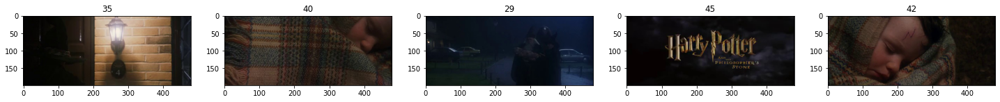

-- Scene 2 Max [0.30180636] --
Mr. and Mrs. Dursley, of number four, Privet Drive, were proud to say that they were perfectly normal, thank you very much.
new chunk


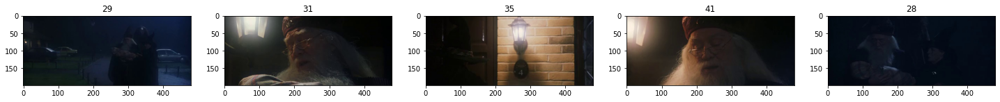

-- Scene 2 Max [0.35751045] --
Dumbledore took in his arms and turned toward the Dursleys' house.
** NEW CHAPTER **
Chapter 1
new chunk


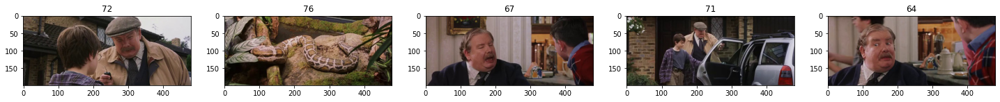

-- Scene 4 Max [0.31650475] --
Don't ask questions -- that was the first rule for a quiet life with the Dursleys.
new chunk


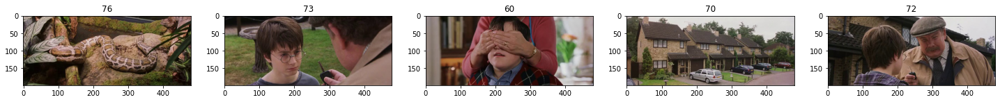

-- Scene 4 Max [0.31444335] --
Half an hour later, Harry, who couldn't believe his luck, was sitting in the back of the Dursleys' car with Piers and Dudley, on the way to the zoo for the first time in his life.
new chunk


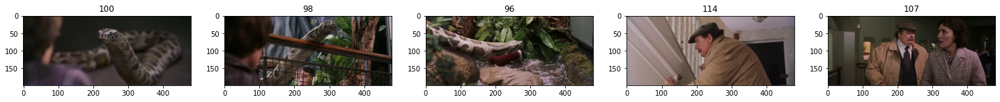

-- Scene 5 Max [0.30415457] --
The snake jerked its head toward Uncle Vernon and Dudley, then raised its eyes to the ceiling.
** NEW CHAPTER **
Chapter 2
new chunk


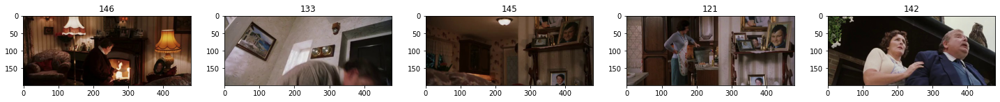

-- Scene 6 Max [0.32320872] --
The Dursleys' house had four bedrooms: one for Uncle Vernon and Aunt Petunia, one for visitors (usually Uncle Vernon's sister, Marge), one where Dudley slept, and one where Dudley kept all the toys and things that wouldn't fit into his first bedroom.
new chunk


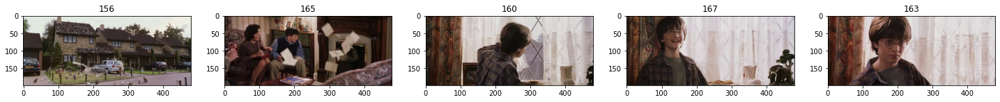

-- Scene 7 Max [0.3614668] --
Maybe the house in Privet Drive would be so full of letters when they got back that he'd be able to steal one somehow.
** NEW CHAPTER **
Chapter 3
new chunk


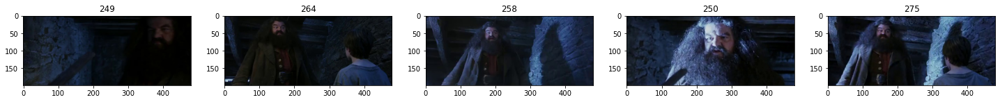

-- Scene 13 Max [0.3645314] --
Hagrid looked as if he was about to explode.
new chunk


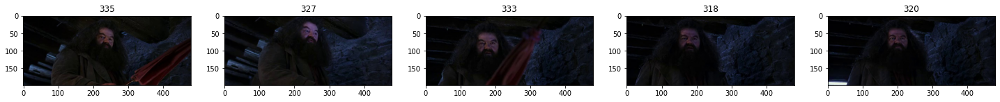

-- Scene 15 Max [0.34219047] --
A braver man than Vernon would have quailed under the furious look Hagrid now gave him; when Hagrid spoke, his every syllable trembled with rage.
new chunk
** NEW CHAPTER **
Chapter 4
new chunk


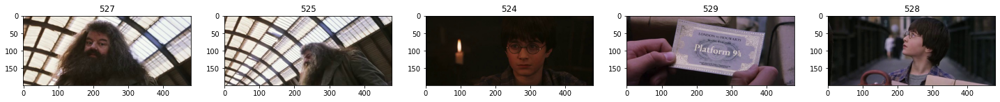

-- Scene 26 Max [0.3620754] --
I dreamed a giant called Hagrid came to tell me I was going to a school for wizards.
new chunk


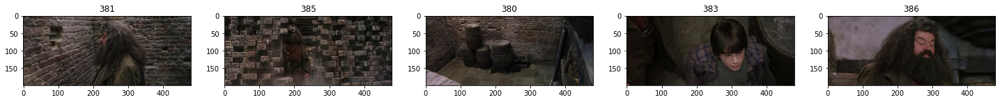

-- Scene 19 Max [0.32898927] --
Hagrid folded up his newspaper, and they clambered up the stone steps onto the street.
new chunk
new chunk


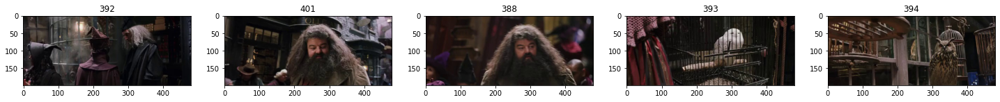

-- Scene 20 Max [0.32919142] --
was rather quiet as he ate the ice cream Hagrid had bought him (chocolate and raspberry with chopped nuts).
** NEW CHAPTER **
Chapter 5
new chunk


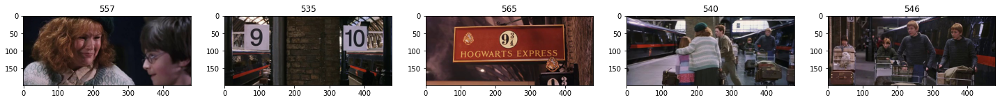

-- Scene 27 Max [0.3090694] --
Two hours later, Harry's huge, heavy trunk had been loaded into the Dursleys' car, Aunt Petunia had talked Dudley into sitting next to Harry, and they had set off.
new chunk


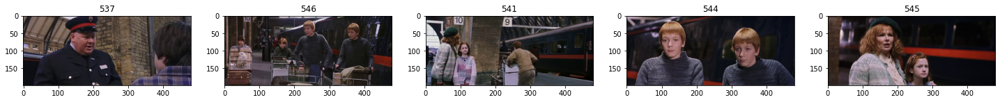

-- Scene 27 Max [0.32680133] --
With a last look at Harry, the twins hopped off the train.
new chunk
new chunk


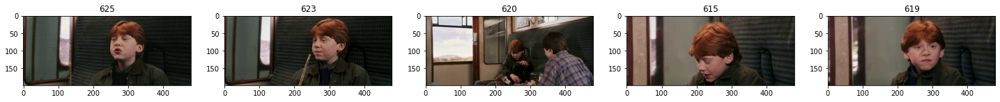

-- Scene 29 Max [0.30990767] --
The door of the compartment slid open and the youngest redheaded boy came in.
new chunk


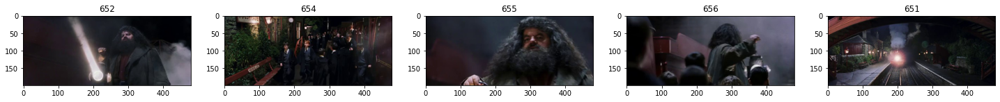

-- Scene 30 Max [0.3367687] --
Hagrid's big hairy face beamed over the sea of heads.
** NEW CHAPTER **
Chapter 6
new chunk


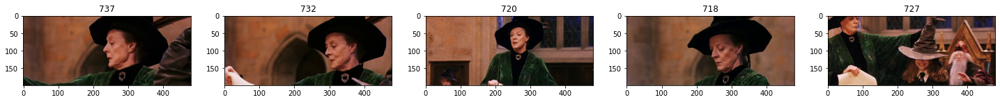

-- Scene 34 Max [0.36156356] --
Professor McGonagall had returned.
new chunk


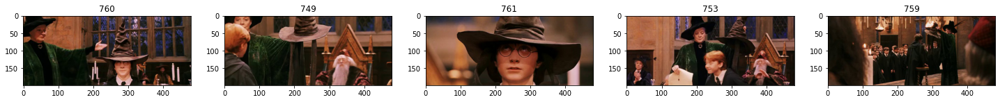

-- Scene 35 Max [0.32376403] --
For I'm the Hogwarts Sorting Hat
new chunk


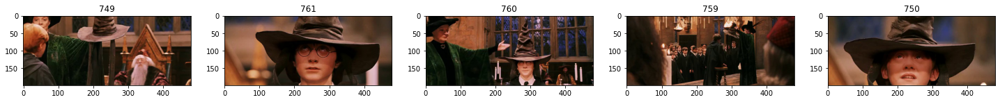

-- Scene 35 Max [0.31900036] --
The Sorting Hat can't see,
new chunk


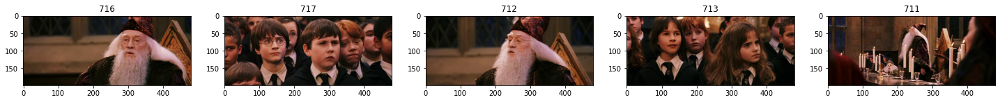

-- Scene 34 Max [0.32805502] --
Dumbledore's twinkling eyes flashed in the direction of the twins.
new chunk


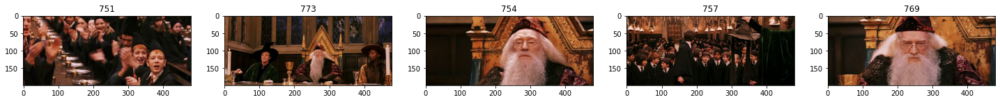

-- Scene 35 Max [0.32248992] --
Dumbledore conducted their last few lines with his wand and when they had finished, he was one of those who clapped loudest.
new chunk


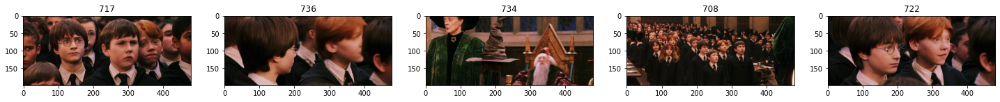

-- Scene 34 Max [0.31051445] --
Peeves stuck out his tongue and vanished, dropping the walking sticks on Neville's head.
** NEW CHAPTER **
Chapter 7
new chunk


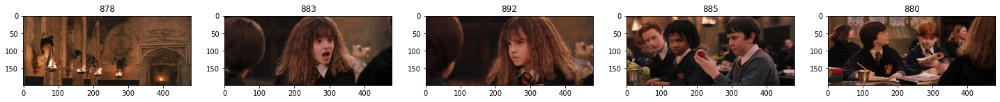

-- Scene 40 Max [0.3351936] --
It was lucky that had tea with Hagrid to look forward to, because the Potions lesson turned out to be the worst thing that had happened to him so far.
new chunk


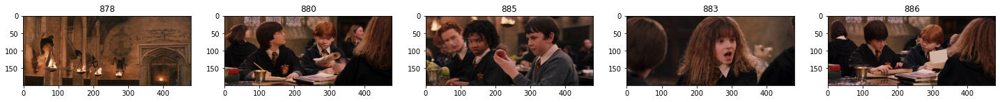

-- Scene 40 Max [0.34689468] --
While Ron told Hagrid all about Charlie's work with dragons, picked up a piece of paper that was lying on the table under the tea cozy.
** NEW CHAPTER **
Chapter 8
new chunk


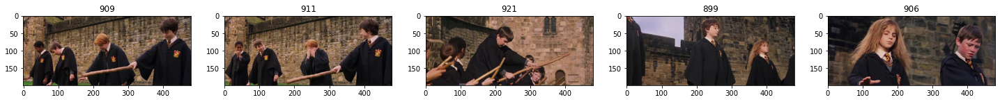

-- Scene 41 Max [0.34618455] --
He pulled his broomstick up a little to take it even higher, and heard screams and gasps of girls back on the ground and an admiring whoop from Ron.
new chunk


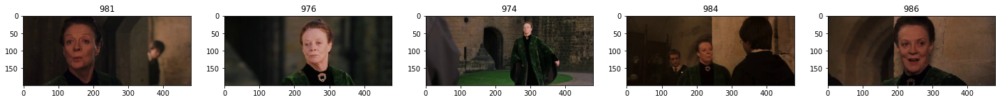

-- Scene 44 Max [0.35470858] --
Professor McGonagall peered sternly over her glasses at Harry.
new chunk


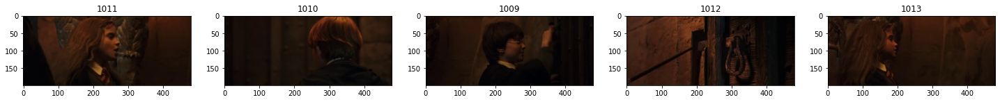

-- Scene 46 Max [0.34272274] --
Hermione opened her mouth, perhaps to tell Ron exactly how to use the Curse of the Bogies, but hissed at her to be quiet and beckoned them all forward.
** NEW CHAPTER **
Chapter 9
new chunk


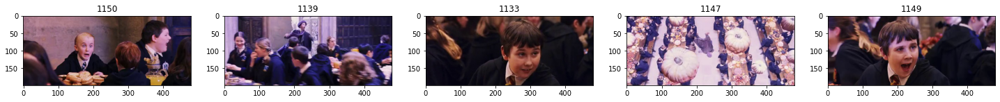

-- Scene 53 Max [0.34823903] --
Before Ron could answer, Professor Flitwick appeared at Malfoy's elbow.
** NEW CHAPTER **
Chapter 10
new chunk


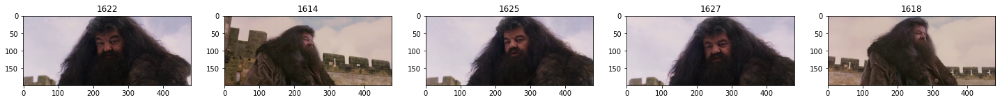

-- Scene 75 Max [0.36843592] --
Hagrid could be seen from the upstairs windows defrosting broomsticks on the Quidditch field, bundled up in a long moleskin overcoat, rabbit fur gloves, and enormous beaverskin boots.
new chunk


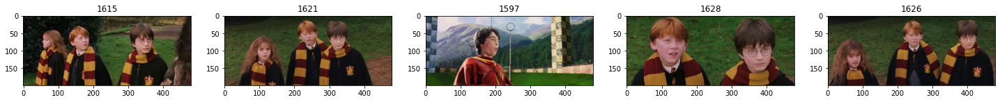

-- Scene 75 Max [0.31680143] --
By eleven o'clock the whole school seemed to be out in the stands around the Quidditch pitch.
new chunk


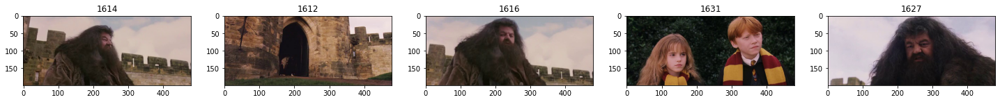

-- Scene 75 Max [0.30987507] --
Ron and Hermione squeezed together to give Hagrid enough space to join them.
new chunk


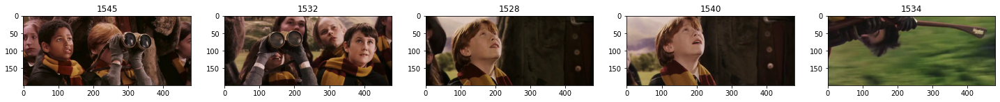

-- Scene 72 Max [0.34489095] --
Ron turned the binoculars back on Harry.
** NEW CHAPTER **
Chapter 11
new chunk


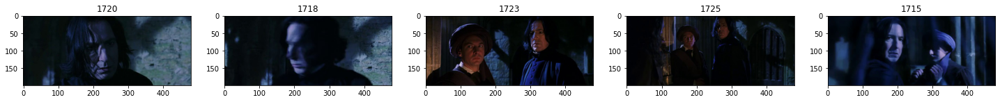

-- Scene 81 Max [0.3382198] --
Worst of all were Professor Snape's classes down in the dungeons, where their breath rose in a mist before them and they kept as close as possible to their hot cauldrons.
new chunk


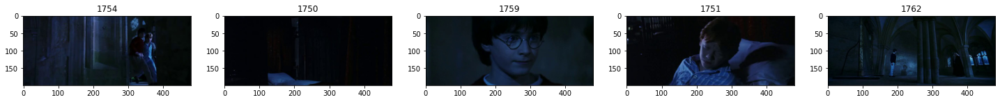

-- Scene 83 Max [0.33593506] --
Fred and George were wearing blue sweaters, one with a large yellow F on it, the other a G.
new chunk


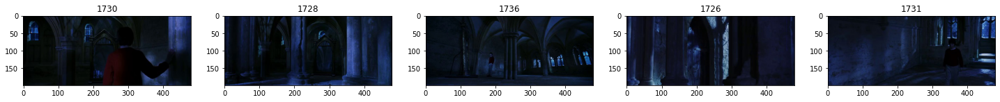

-- Scene 82 Max [0.31997886] --
He passed Filch in the doorway; Filch's pale, wild eyes looked straight through him, and slipped under Filch's outstretched arm and streaked off up the corridor, the book's shrieks still ringing in his ears.
new chunk


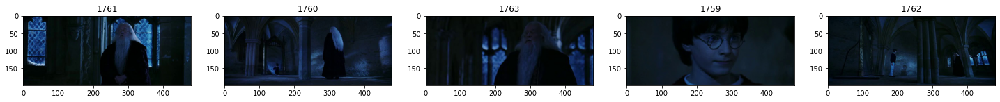

-- Scene 83 Max [0.3388757] --
Sitting on one of the desks by the wall was none other than Albus Dumbledore.
** NEW CHAPTER **
Chapter 12
new chunk


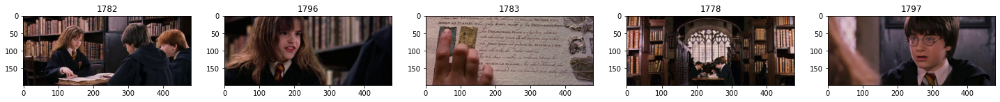

-- Scene 85 Max [0.30900797] --
felt in the pocket of his robes and pulled out a Chocolate Frog, the very last one from the box Hermione had given him for Christmas.
new chunk


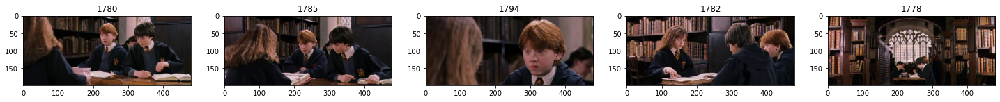

-- Scene 85 Max [0.32866415] --
She pushed the book toward them, and and Ron read:
new chunk


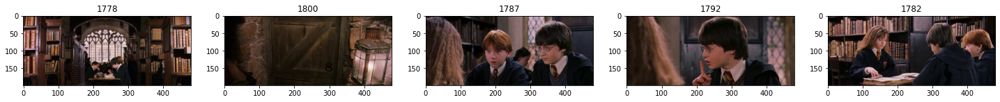

-- Scene 85 Max [0.3243484] --
Potions lessons were turning into a sort of weekly torture, Snape was so horrible to Harry.
new chunk
** NEW CHAPTER **
Chapter 13
new chunk


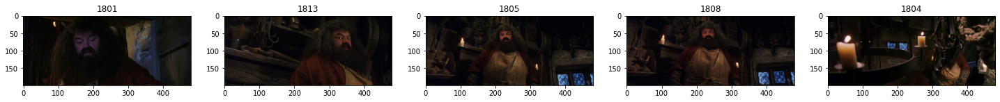

-- Scene 86 Max [0.33541778] --
Hagrid was about to answer when the color suddenly drained from his face -- he leapt to his feet and ran to the window.
new chunk


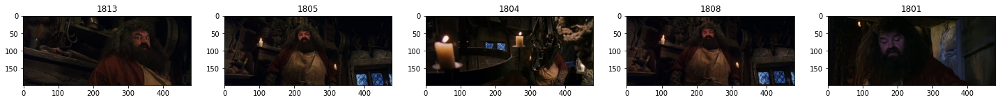

-- Scene 86 Max [0.3321187] --
And in the end, Hagrid agreed that they could send an owl to Charlie to ask him.
new chunk


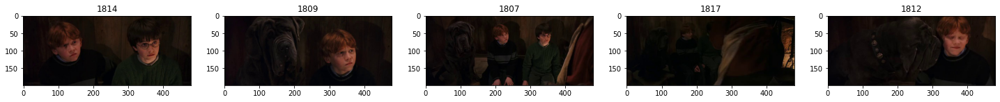

-- Scene 86 Max [0.3084677] --
When they told him about Charlie's letter, his eyes filled with tears, although that might have been because Norbert had just bitten him on the leg.
** NEW CHAPTER **
Chapter 14
new chunk


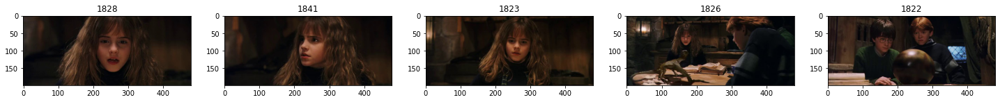

-- Scene 87 Max [0.3384672] --
It was the first time Hermione had ever failed to answer a teacher's question.
new chunk


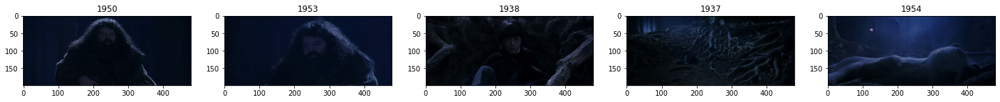

-- Scene 92 Max [0.3490458] --
saw that Hagrid looked very worried.
** NEW CHAPTER **
Chapter 15
new chunk


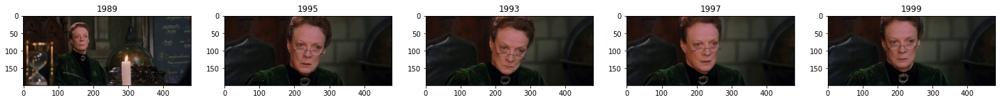

-- Scene 95 Max [0.3606838] --
Professor McGonagall watched them turn a mouse into a snuffbox -- points were given for how pretty the snuffbox was, but taken away if it had whiskers.
new chunk


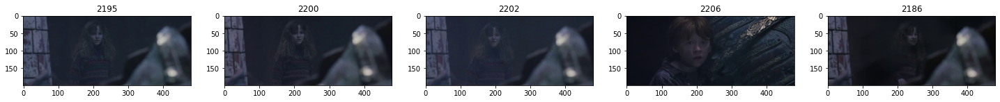

-- Scene 103 Max [0.31559446] --
Ron dived, Hermione rocketed upward, the key dodged them both, and streaked after it; it sped toward the wall, leaned forward and with a nasty, crunching noise, pinned it against the stone with one hand.
new chunk
** NEW CHAPTER **
Chapter 16
new chunk


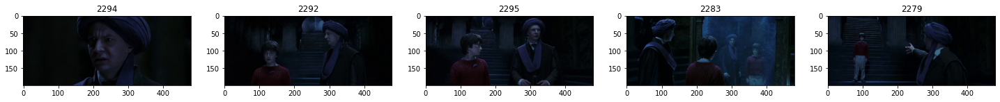

-- Scene 107 Max [0.38679034] --
For the first time, a spasm of fear flitted across Quirrell's face.
new chunk


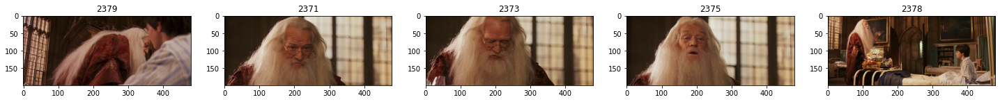

-- Scene 112 Max [0.34963274] --
Dumbledore smiled at the look of amazement on Harry's face.
new chunk


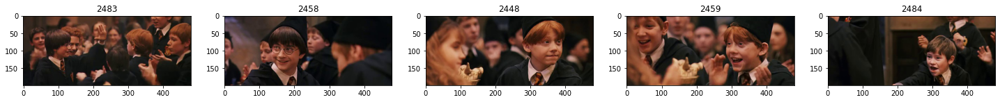

-- Scene 116 Max [0.33253902] --
It was Ginny Weasley, Ron's younger sister, but she wasn't pointing at Ron.
** NEW CHAPTER **


In [69]:
chap_chunk_scene_alignment = {}

for chapterIdx in range(len(book.chapterContent)):
    
    print(f"Chapter {chapterIdx}")
    chap_chunk_scene_alignment[chapterIdx] = {}
    
    scenes_for_chapter = []
    
    for align in alignment:
        if align['chapter'] == chapterIdx:
            scenes_for_chapter.append(align['scene'])
            
    # Get chapter chunks
    chapterChunks = book.getAllChunks()[chapterIdx]
    
    for chunk in chapterChunks:
        matched_scenes = matchChunkScenes(chunk, scenes_for_chapter)
        
        if len(matched_scenes) == 0:
            print("new chunk")
            matched_scene = matchChunkScenesCLIP(chunk, scenes_for_chapter)
            
        chap_chunk_scene_alignment[chapterIdx][chunk] = list(matched_scene) # Convert set to list
            
    print("** NEW CHAPTER **")
    
# break

In [72]:
savecache(chap_chunk_scene_alignment, 'chap_chunk_scene_alignment')

0

In [21]:
chap_chunk_scene_alignment = loadcache('chap_chunk_scene_alignment').item()
# chap_chunk_scene_alignment.item()

# ----------------------------------- SONGS -----------------------------------

In [22]:
from scripts.voiceResult import Result

## Fetch a song

In [23]:
songInfo = np.load("processed/hp/songInfo.npy", allow_pickle=True)

In [25]:
def getCurSongs(songList, start, end):
    
    songs = []
    
    for song in songList:
#         print(song.time, s)
        if song.result['matches'] and song.time >= start and song.time <= end:
            songs.append(song.result)
            
    return songs

## Process and Extract a song

In [26]:
import pydub
from pydub import AudioSegment

Load music chunk - and return the chunk that the offset belongs to

In [28]:
def makeSnippet(name, offset):
    
    offset = int(offset)
    
    song = AudioSegment.from_mp3(os.path.join(f"data/hp/soundtrack/{name}"))
#     print(f"data/HP/soundtrack/{name}")
#     print(offset * 1000, min((offset + 120) * 1000, len(song)-1), len(song))
    
    song = song[offset * 1000: min((offset + 450) * 1000, len(song)-1)]
    new_song = song.fade_in(5000).fade_out(5000)
    
    return new_song

# Load all Music Chunks

In [ ]:
SEGMENTED_AUDIO_PATH = "processed/hp/segmented_audio_info"


In [30]:
songs_list = sorted(os.listdir(SEGMENTED_AUDIO_PATH))
SONG_CHUNK_LIST = []
CHUNKS_PER_SONG = {}

for song_name in songs_list:
    
    SONG_INFO = []
    
    song_segmented_info = sio.loadmat(os.path.join(SEGMENTED_AUDIO_PATH, song_name))
    song_segmented_info = json.loads(song_segmented_info['song_segmented_json'][0])

    if type(song_segmented_info['segments']) is not list:
        song_segmented_info['segments'] = [song_segmented_info['segments']]
    
    start = 0
    for i, segment in enumerate(song_segmented_info['segments']):
        SONG_INFO.append({
            'name': song_name,
            'start': start,
            'end': segment,
            'mode': song_segmented_info['mode'][i],
            'rms': song_segmented_info['rms'][i]            
        })
    SONG_INFO.append({
        'name': song_name,
        'start': song_segmented_info['segments'][-1],
        'end': -1,
        'mode': song_segmented_info['mode'][-1],
        'rms': song_segmented_info['rms'][-1]            
    })
    
        
    CHUNKS_PER_SONG[song_name] = SONG_INFO
    
    for song_info in SONG_INFO:
        if 'Hedwig' not in song_info['name']:
            SONG_CHUNK_LIST.append(song_info)

# -------------------------------------- GENERATE ----------------------------------------

In [35]:
import random

## Get Book Emotion Files

In [36]:
emotion_sheets = sorted(os.listdir('processed/hp/book_emotions/'))

Get song list

In [37]:
songList = os.listdir("data/hp/soundtrack")

In [38]:
# Sometimes shazam names and the track names mismatch - choose the max overlap one
def getMatchingSongId(str1):
    return np.argmax(list(map(lambda x: pylcs.lcs(str1, ' '.join(x.split('-'))[1:]), songList)))

In [39]:
def prepare_song(songChunk, chunkText):
    
    word_count = len(chunkText.split())
    time_est = word_count // 300 * 60
    
    song = AudioSegment.from_mp3(os.path.join(f"data/HP/soundtrack/{songChunk['name'].replace('mat', 'mp3')}"))
    song = song[songChunk['start'] * 1000: songChunk['end'] * 1000 if songChunk['end'] != -1 else -1]
    
    song_length = int(song.duration_seconds)
    
#     print(song_length, time_est)
    
    if song_length < time_est:
        loop_count = int(time_est // song_length)
        
        for count in range(loop_count-1):
            song = song.append(song, crossfade=3000)
        
    song = song.fade_in(5000).fade_out(5000)
#     song -= 2
    
    return song

Go through chapter by chapter

In [40]:
def recycle_music(chunkText, prevSongChunk, emotion_labels):
    
    chunkEmotions = list(filter(lambda x: x not in ['neutral', 'ambiguous'], emotion_labels))
    chunkEmotions = dict(Counter(chunkEmotions))

    if 'positive' not in chunkEmotions:
        chunkEmotions['positive'] = 0
    if 'negative' not in chunkEmotions:
        chunkEmotions['negative'] = 0
    
    candidate_list = None

    if chunkEmotions['negative'] > chunkEmotions['positive']:
        candidate_list = list(filter(lambda x: x['mode'] < 0, SONG_CHUNK_LIST))
    elif chunkEmotions['negative'] <= chunkEmotions['positive']:
        candidate_list = list(filter(lambda x: x['mode'] >= 0, SONG_CHUNK_LIST))    
    
#     if chunkEmotions['negative'] > chunkEmotions['positive']:
#         candidate_list = list(filter(lambda x: x['mode'] < 0 and x['rms'] <= 0.03, SONG_CHUNK_LIST))
#     elif chunkEmotions['negative'] <= chunkEmotions['positive']:
#         candidate_list = list(filter(lambda x: x['mode'] >= 0  and x['rms'] <= 0.03, SONG_CHUNK_LIST))
    
    random_chunk = random.choice(candidate_list)
    if random_chunk == prevSongChunk:
        random_chunk = random.choice(candidate_list)
        
    return random_chunk

In [41]:
def get_chunk_music(chunkText, chunkScene, prevSongChunk, emotion_labels):
    
    chunkEmotions = list(filter(lambda x: x not in ['neutral', 'ambiguous'], emotion_labels))
    chunkEmotions = dict(Counter(chunkEmotions))

    if 'positive' not in chunkEmotions:
        chunkEmotions['positive'] = 0
    if 'negative' not in chunkEmotions:
        chunkEmotions['negative'] = 0
    
    start, end, num, start_t, end_t = scene_break_times[chunkScene]
    
    scene_songs = getCurSongs(songInfo, start_t, end_t)
    song_names = [scene_song['track']['title'] for scene_song in scene_songs]
    
    song_counter = dict(Counter(song_names))
    song_sorted = sorted(song_counter.keys(), key=lambda x: song_counter[x], reverse=True)
    
    if len(song_sorted) == 0:
        return None
    
    selected_song = song_sorted[0]

    songId = getMatchingSongId(selected_song)
    song = songList[songId]
    
    song_chunks = CHUNKS_PER_SONG[song.replace("mp3", "mat")]

    chosen_song_chunk = None
    
    for song_chunk in song_chunks:
        if song_chunk == prevSongChunk:
            continue
        
        if chunkEmotions['negative'] > chunkEmotions['positive'] and song_chunk['mode'] < 0:
            chosen_song_chunk = song_chunk
        elif chunkEmotions['negative'] <= chunkEmotions['positive'] and song_chunk['mode'] >= 0:
            chosen_song_chunk = song_chunk
            
    if chosen_song_chunk is None:
        song_chunks = sorted(song_chunks, key=lambda x: x['rms'])
        chosen_song_chunk = song_chunks[0] if song_chunks[0] != prevSongChunk else song_chunks[1]
        
    return chosen_song_chunk

In [42]:
def getChunkEmotions(emotion_file, chunkText):
    
    emotions = []
    
    chunkTextLines = chunkText.splitlines()
    
    for chunkTextLine in chunkTextLines:
        
        chunkTextLine = chunkTextLine.strip()
        
        if len(chunkTextLine) == 0:
            continue
        
        for para_idx in range(len(emotion_file)):
            
            para_text = emotion_file.iloc[para_idx]['Paragraph Text']
            if chunkTextLine in para_text:
                
                emotion_str = emotion_file.iloc[para_idx]['Binary Emotion Class/Score'].replace("\'", "\"")
                
                emotion = json.loads(emotion_str)
                
                try:
                    emotions.append(emotion['labels'][0])
                except:
                    continue
                
    return emotions

In [43]:
OUT_BASEDIR = "generated"
chunk_counts = []
per_chunk_counts = []

for chapterIdx in chap_chunk_scene_alignment.keys():
    
    print(f"Chapter {chapterIdx}")
    chapter = chap_chunk_scene_alignment[chapterIdx]
    emotion_file = pd.read_csv(os.path.join('data/hp/book_emotions', emotion_sheets[chapterIdx]))
    
    prevSong = None
        
    avail = 0
    for chunkIdx, chunk in enumerate(chapter.keys()):
                        
        chunkText = chunk
        chunkScenes = chapter[chunk]

        chunkEmotions = getChunkEmotions(emotion_file, chunkText)
        
        if len(chunkScenes) == 0:
            song = recycle_music(chunkText, prevSong, chunkEmotions)
        else:
            chunkScene = chunkScenes[0]
            song = get_chunk_music(chunkText, chunkScene, prevSong, chunkEmotions)
            
            if song is None:
                song = recycle_music(chunkText, prevSong, chunkEmotions)
            else:
                avail += 1
                
        prevSong = song
        print('-', chunkIdx, song['name'])

        song = prepare_song(song, chunkText)
        
        os.makedirs(f"{OUT_BASEDIR}/{chapterIdx}", exist_ok=True)
        out = song.export(f"{OUT_BASEDIR}/{chapterIdx}/{chunkIdx}.mp3", format="mp3")

        
    per_chunk_counts.append(avail)
    chunk_counts.append(len(chapter.keys()))

Chapter 0
- 0 03. John Williams - The Arrival Of Baby Harry.mat
- 1 03. John Williams - The Arrival Of Baby Harry.mat
- 2 03. John Williams - The Arrival Of Baby Harry.mat
Chapter 1
- 0 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
- 1 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
- 2 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
Chapter 2
- 0 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
- 1 05. John Williams - Diagon Alley - The Gringotts Vault.mat
- 2 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
Chapter 3
- 0 04. John Williams - Visit To The Zoo - Letters From Hogwarts.mat
- 1 05. John Williams - Diagon Alley - The Gringotts Vault.mat
- 2 06. John Williams - Platform Nine-and-Three-Quarters - The Journey To Hogwarts.mat
- 3 07. John Williams - Entry Into The Great Hall And The Banquet.mat
- 4 01. John Williams - Prologue.mat
Chapter 4
- 0 03. John Williams - The Arrival Of Baby Harry.mat
